# Predicting Depression, Anxiety and Stress using Artificial Neural Networks

#### Data is available on  https://openpsychometrics.org/tests/TMAS/ and at https://www.kaggle.com/yamqwe/depression-anxiety-stress-scales

### Setup Codebook

In [36]:
codebook = open('./codebook.txt', 'r').read()

%matplotlib inline
from IPython.core.display import display, HTML, Javascript

# ----- Notebook Theme -----

notebook_theme = 'carrot'
color_maps = {'turquoise': ['#1abc9c', '#e8f8f5', '#d1f2eb', '#a3e4d7', '#76d7c4', '#48c9b0', '#1abc9c', '#17a589', '#148f77', '#117864', '#0e6251'], 'green': ['#16a085', '#e8f6f3', '#d0ece7', '#a2d9ce', '#73c6b6', '#45b39d', '#16a085', '#138d75', '#117a65', '#0e6655', '#0b5345'], 'emerald': ['#2ecc71', '#eafaf1', '#d5f5e3', '#abebc6', '#82e0aa', '#58d68d', '#2ecc71', '#28b463', '#239b56', '#1d8348', '#186a3b'], 'nephritis': ['#27ae60', '#e9f7ef', '#d4efdf', '#a9dfbf', '#7dcea0', '#52be80', '#27ae60', '#229954', '#1e8449', '#196f3d', '#145a32'], 'peter': ['#3498db', '#ebf5fb', '#d6eaf8', '#aed6f1', '#85c1e9', '#5dade2', '#3498db', '#2e86c1', '#2874a6', '#21618c', '#1b4f72'], 'belize': ['#2980b9', '#eaf2f8', '#d4e6f1', '#a9cce3', '#7fb3d5', '#5499c7', '#2980b9', '#2471a3', '#1f618d', '#1a5276', '#154360'], 'amethyst': ['#9b59b6', '#f5eef8', '#ebdef0', '#d7bde2', '#c39bd3', '#af7ac5', '#9b59b6', '#884ea0', '#76448a', '#633974', '#512e5f'], 'wisteria': ['#8e44ad', '#f4ecf7', '#e8daef', '#d2b4de', '#bb8fce', '#a569bd', '#8e44ad', '#7d3c98', '#6c3483', '#5b2c6f', '#4a235a'], 'wet': ['#34495e', '#ebedef', '#d6dbdf', '#aeb6bf', '#85929e', '#5d6d7e', '#34495e', '#2e4053', '#283747', '#212f3c', '#1b2631'], 'midnight': ['#2c3e50', '#eaecee', '#d5d8dc', '#abb2b9', '#808b96', '#566573', '#2c3e50', '#273746', '#212f3d', '#1c2833', '#17202a'], 'sunflower': ['#f1c40f', '#fef9e7', '#fcf3cf', '#f9e79f', '#f7dc6f', '#f4d03f', '#f1c40f', '#d4ac0d', '#b7950b', '#9a7d0a', '#7d6608'], 'orange': ['#f39c12', '#fef5e7', '#fdebd0', '#fad7a0', '#f8c471', '#f5b041', '#f39c12', '#d68910', '#b9770e', '#9c640c', '#7e5109'], 'carrot': ['#e67e22', '#fdf2e9', '#fae5d3', '#f5cba7', '#f0b27a', '#eb984e', '#e67e22', '#ca6f1e', '#af601a', '#935116', '#784212'], 'pumpkin': ['#d35400', '#fbeee6', '#f6ddcc', '#edbb99', '#e59866', '#dc7633', '#d35400', '#ba4a00', '#a04000', '#873600', '#6e2c00'], 'alizarin': ['#e74c3c', '#fdedec', '#fadbd8', '#f5b7b1', '#f1948a', '#ec7063', '#e74c3c', '#cb4335', '#b03a2e', '#943126', '#78281f'], 'pomegranate': ['#c0392b', '#f9ebea', '#f2d7d5', '#e6b0aa', '#d98880', '#cd6155', '#c0392b', '#a93226', '#922b21', '#7b241c', '#641e16'], 'clouds': ['#ecf0f1', '#fdfefe', '#fbfcfc', '#f7f9f9', '#f4f6f7', '#f0f3f4', '#ecf0f1', '#d0d3d4', '#b3b6b7', '#979a9a', '#7b7d7d'], 'silver': ['#bdc3c7', '#f8f9f9', '#f2f3f4', '#e5e7e9', '#d7dbdd', '#cacfd2', '#bdc3c7', '#a6acaf', '#909497', '#797d7f', '#626567'], 'concrete': ['#95a5a6', '#f4f6f6', '#eaeded', '#d5dbdb', '#bfc9ca', '#aab7b8', '#95a5a6', '#839192', '#717d7e', '#5f6a6a', '#4d5656'], 'asbestos': ['#7f8c8d', '#f2f4f4', '#e5e8e8', '#ccd1d1', '#b2babb', '#99a3a4', '#7f8c8d', '#707b7c', '#616a6b', '#515a5a', '#424949']}
# color_maps = {'red': ['#f44336', '#ffebee', '#ffcdd2', '#ef9a9a', '#e57373', '#ef5350', '#f44336', '#e53935', '#d32f2f', '#c62828', '#b71c1c', '#ff8a80', '#ff5252', '#ff1744', '#d50000'], 'pink': ['#e91e63', '#fce4ec', '#f8bbd0', '#f48fb1', '#f06292', '#ec407a', '#e91e63', '#d81b60', '#c2185b', '#ad1457', '#880e4f', '#ff80ab', '#ff4081', '#f50057', '#c51162'], 'purple': ['#9c27b0', '#f3e5f5', '#e1bee7', '#ce93d8', '#ba68c8', '#ab47bc', '#9c27b0', '#8e24aa', '#7b1fa2', '#6a1b9a', '#4a148c', '#ea80fc', '#e040fb', '#d500f9', '#aa00ff'], 'deep': ['#673ab7', '#ede7f6', '#d1c4e9', '#b39ddb', '#9575cd', '#7e57c2', '#673ab7', '#5e35b1', '#512da8', '#4527a0', '#311b92', '#b388ff', '#7c4dff', '#651fff', '#6200ea', '#ff5722', '#fbe9e7', '#ffccbc', '#ffab91', '#ff8a65', '#ff7043', '#ff5722', '#f4511e', '#e64a19', '#d84315', '#bf360c', '#ff9e80', '#ff6e40', '#ff3d00', '#dd2c00'], 'indigo': ['#3f51b5', '#e8eaf6', '#c5cae9', '#9fa8da', '#7986cb', '#5c6bc0', '#3f51b5', '#3949ab', '#303f9f', '#283593', '#1a237e', '#8c9eff', '#536dfe', '#3d5afe', '#304ffe'], 'blue': ['#2196f3', '#e3f2fd', '#bbdefb', '#90caf9', '#64b5f6', '#42a5f5', '#2196f3', '#1e88e5', '#1976d2', '#1565c0', '#0d47a1', '#82b1ff', '#448aff', '#2979ff', '#2962ff', '#607d8b', '#eceff1', '#cfd8dc', '#b0bec5', '#90a4ae', '#78909c', '#607d8b', '#546e7a', '#455a64', '#37474f', '#263238'], 'light': ['#03a9f4', '#e1f5fe', '#b3e5fc', '#81d4fa', '#4fc3f7', '#29b6f6', '#03a9f4', '#039be5', '#0288d1', '#0277bd', '#01579b', '#80d8ff', '#40c4ff', '#00b0ff', '#0091ea', '#8bc34a', '#f1f8e9', '#dcedc8', '#c5e1a5', '#aed581', '#9ccc65', '#8bc34a', '#7cb342', '#689f38', '#558b2f', '#33691e', '#ccff90', '#b2ff59', '#76ff03', '#64dd17'], 'cyan': ['#00bcd4', '#e0f7fa', '#b2ebf2', '#80deea', '#4dd0e1', '#26c6da', '#00bcd4', '#00acc1', '#0097a7', '#00838f', '#006064', '#84ffff', '#18ffff', '#00e5ff', '#00b8d4'], 'teal': ['#009688', '#e0f2f1', '#b2dfdb', '#80cbc4', '#4db6ac', '#26a69a', '#009688', '#00897b', '#00796b', '#00695c', '#004d40', '#a7ffeb', '#64ffda', '#1de9b6', '#00bfa5'], 'green': ['#4caf50', '#e8f5e9', '#c8e6c9', '#a5d6a7', '#81c784', '#66bb6a', '#4caf50', '#43a047', '#388e3c', '#2e7d32', '#1b5e20', '#b9f6ca', '#69f0ae', '#00e676', '#00c853'], 'lime': ['#cddc39', '#f9fbe7', '#f0f4c3', '#e6ee9c', '#dce775', '#d4e157', '#cddc39', '#c0ca33', '#afb42b', '#9e9d24', '#827717', '#f4ff81', '#eeff41', '#c6ff00', '#aeea00'], 'yellow': ['#ffeb3b', '#fffde7', '#fff9c4', '#fff59d', '#fff176', '#ffee58', '#ffeb3b', '#fdd835', '#fbc02d', '#f9a825', '#f57f17', '#ffff8d', '#ffff00', '#ffea00', '#ffd600'], 'amber': ['#ffc107', '#fff8e1', '#ffecb3', '#ffe082', '#ffd54f', '#ffca28', '#ffc107', '#ffb300', '#ffa000', '#ff8f00', '#ff6f00', '#ffe57f', '#ffd740', '#ffc400', '#ffab00'], 'orange': ['#ff9800', '#fff3e0', '#ffe0b2', '#ffcc80', '#ffb74d', '#ffa726', '#ff9800', '#fb8c00', '#f57c00', '#ef6c00', '#e65100', '#ffd180', '#ffab40', '#ff9100', '#ff6d00'], 'brown': ['#795548', '#efebe9', '#d7ccc8', '#bcaaa4', '#a1887f', '#8d6e63', '#795548', '#6d4c41', '#5d4037', '#4e342e', '#3e2723'], 'grey': ['#9e9e9e', '#fafafa', '#f5f5f5', '#eeeeee', '#e0e0e0', '#bdbdbd', '#9e9e9e', '#757575', '#616161', '#424242', '#212121'], 'white': ['#ffffff'], 'black': ['#000000']}

color_maps = {i: color_maps[i] for i in color_maps if i not in ['clouds', 'silver', 'concrete', 'asbestos', 'wet asphalt', 'midnight blue', 'wet']}

CMAP = 'Orange'
prompt = '#1DBCCD'
main_color = '#E58F65' # color_maps[notebook_theme]
strong_main_color = '#EB9514' # = color_maps[notebook_theme] 
custom_colors = [strong_main_color, main_color]

def get_from_last_space(line, idx):
    to_return = ''
    while idx > 0 and line[idx] != ' ':
        idx -= 1
        to_return += line[idx]
    return to_return[::-1]

def get_to_next_eq(line, idx):
    to_return = ''
    while idx < len(line) - 1 and line[idx + 1] != '=':
        to_return += line[idx]
        idx += 1
    return to_return.split('=')[0]

def parse_codebook(codebook_text):
    q_dict = {}
    for line in codebook_text.split('\n'):
        if '.' in line and len(line.split('=')) > 2:
            question = line.split('.')[0]
            answers = ''.join(line.split('.')[1:])            
            for idx in range(len(answers)):
                if answers[idx] == '=':
                    key = get_from_last_space(answers, idx).lstrip()
                    if len(key) != 0 and '(' == key[0]: key = key[1:]
                    val = get_to_next_eq(answers, idx + 1)
                    if val.endswith(', '): val = val[:-2]
                    if question not in q_dict: q_dict[question] = {}
                    if key not in q_dict[question]: q_dict[question][key] = val
    return q_dict

def map_questions(codebook_text):
    q_dict = {}
    for line in codebook_text.split('\n'):
        q_text = ''
        if '\t' in line:                   
            question = line.split('\t')[0]
            q_text = line.split('\t')[1]            
        elif 'TIPI' in line: 
            question = line.split(' ')[0]
            q_text = ' '.join(line.split(' ')[1:])
        elif 'VCL' in line:             
            question = line.split(' ')[0]
            q_text = ' '.join(line.split(' ')[1:])            
        if len(q_text) > 2:
            q_dict[question] = q_text                
    return q_dict

# print(codebook)
q_dict = parse_codebook(codebook)
q_mapping = map_questions(codebook)
# print(q_mapping)

def plot_correlation(df, cmap='RdBu_r'):
    size = len(df.columns)
    fig, ax = plt.subplots(figsize=(1.3 * size, 1. * size))
    corr = df.corr()

    im = ax.matshow(corr, cmap=cmap)
    for (i, j), z in np.ndenumerate(corr):
        ax.text(j, i, '{:0.2f}'.format(z), ha='center', va='center',
                bbox=dict(boxstyle='round', facecolor='white', edgecolor='0.3'))

    plt.xticks(range(df.select_dtypes(['number']).shape[1]), df.select_dtypes(['number']).columns, fontsize=14, rotation=90)
    plt.yticks(range(df.select_dtypes(['number']).shape[1]), df.select_dtypes(['number']).columns, fontsize=14)
    cb = plt.colorbar(im)
    ax.tick_params(labelsize=14)
    plt.show()


### Import Libraries

In [2]:
import time
import shap
import random
import numpy as np
import pandas as pd
import networkx as nx
import seaborn as sns
import tensorflow as tf
from scipy import stats
import matplotlib.cm as cm
from sklearn.svm import SVR
from keras.layers import Dense
import matplotlib.pyplot as plt
from sklearn.metrics import auc
from xgboost import XGBClassifier
from sklearn.manifold import TSNE
from lightgbm import LGBMClassifier
from keras.models import Sequential
from sklearn.impute import KNNImputer
from sklearn.metrics import roc_curve
from sklearn.linear_model import Ridge
from sklearn.metrics import roc_auc_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report
from sklearn.metrics import precision_recall_curve
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import average_precision_score
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RandomizedSearchCV
from category_encoders.target_encoder import TargetEncoder
from pycountry_convert import country_alpha2_to_country_name, country_name_to_country_alpha3

import warnings; warnings.filterwarnings("ignore")

#set all the seeds
seed = 2022

random.seed(seed)
np.random.seed(seed)
tf.random.set_seed(seed)

sns.set_context("poster", font_scale = 0.6,rc = {"grid.linewidth": 0.4})
sns.set_style({'font.family':'serif'})

### Import Data

In [3]:
df = pd.read_csv('./data.csv', sep=r'	')

### Build Target DASS Columns

In [4]:
DASS_keys = {'Depression': [3, 5, 10, 13, 16, 17, 21, 24, 26, 31, 34, 37, 38, 42],
             'Anxiety': [2, 4, 7, 9, 15, 19, 20, 23, 25, 28, 30, 36, 40, 41],
             'Stress': [1, 6, 8, 11, 12, 14, 18, 22, 27, 29, 32, 33, 35, 39]}

DASS_bins = {'Depression': [(0, 10), (10, 14), (14, 21), (21, 28)],
             'Anxiety': [(0, 8), (8, 10), (10, 15), (15, 20)],
             'Stress': [(0, 15), (15, 19), (19, 26), (26, 34)]}
             

for name, keys in DASS_keys.items():
    # Subtract one to match definition of DASS score in source
    df[name] = (df.filter(regex='Q(%s)A' % '|'.join(map(str, keys))) - 1).sum(axis=1)
    
    bins = DASS_bins[name]
    bins.append( (DASS_bins[name][-1][-1], df[name].max() + 1) )
    bins = pd.IntervalIndex.from_tuples(bins, closed='left')
    df[name + '_cat'] = np.arange(len(bins))[pd.cut(df[name], bins=bins).cat.codes]
    
dass = df[DASS_keys.keys()]
dass_cat = df[[k + '_cat' for k in DASS_keys.keys()]]

df[[k + '_cat' for k in DASS_keys.keys()] + list(DASS_keys.keys())].head()

,Depression_cat,Anxiety_cat,Stress_cat,Depression,Anxiety,Stress
0,3,4,4,27,34,40
1,3,3,3,24,17,27
2,4,2,1,39,12,17
3,2,3,1,16,17,16
4,4,4,3,32,40,29


### Adding Personality Type Columns

In [5]:
# Add personality types to data
personality_types = ['Extraversion', 'Agreeableness', 'Conscientiousness', 'EmotionalStability', 'Openness']

# Invert some entries
tipi = df.filter(regex='TIPI\d+').copy()
tipi_inv = tipi.filter(regex='TIPI(2|4|6|8|10)').apply(lambda d: 7 - d)
tipi[tipi.columns.intersection(tipi_inv.columns)] = tipi_inv

# Calculate scores
for idx, pt in enumerate( personality_types ):
    df[pt] = tipi[['TIPI{}'.format(idx + 1), 'TIPI{}'.format(6 + idx)]].mean(axis=1)

personalities = df[personality_types]
character = pd.concat([dass, personalities], axis=1)
character.head()

,Depression,Anxiety,Stress,Extraversion,Agreeableness,Conscientiousness,EmotionalStability,Openness
0,27,34,40,0.5,4.5,4.5,0.5,6.5
1,24,17,27,4.5,4.5,2.0,0.5,3.5
2,39,12,17,1.5,3.5,2.0,4.0,5.0
3,16,17,16,2.0,6.0,6.5,4.5,6.0
4,32,40,29,2.0,3.5,2.0,2.0,4.5


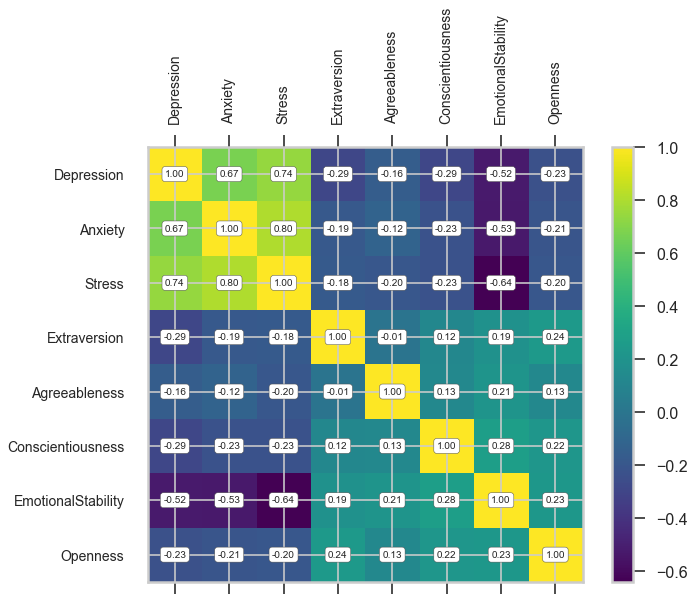

In [38]:
character = pd.concat([dass, personalities], axis=1)
plot_correlation(character, cmap=CMAP)

### Feature Engineering

In [7]:
df = df.rename(columns = {i+'A':q_mapping[i] for i in q_mapping})
df = df.rename(columns = {i+'E':i+'_TimeTaken' for i in q_mapping})
df = df.rename(columns = {i+'I':i+'_SurveyPosition' for i in q_mapping})
df = df.rename(columns = {i:q_mapping[i] for i in q_mapping})
df.head()

,I found myself getting upset by quite trivial things.,Q1_SurveyPosition,Q1_TimeTaken,I was aware of dryness of my mouth.,Q2_SurveyPosition,Q2_TimeTaken,I couldn't seem to experience any positive feeling at all.,Q3_SurveyPosition,Q3_TimeTaken,"I experienced breathing difficulty (eg, excessively rapid breathing, breathlessness in the absence of physical exertion).",...,Depression_cat,Anxiety,Anxiety_cat,Stress,Stress_cat,Extraversion,Agreeableness,Conscientiousness,EmotionalStability,Openness
0,4,28,3890,4,25,2122,2,16,1944,4,...,3,34,4,40,4,0.5,4.5,4.5,0.5,6.5
1,4,2,8118,1,36,2890,2,35,4777,3,...,3,17,3,27,3,4.5,4.5,2.0,0.5,3.5
2,3,7,5784,1,33,4373,4,41,3242,1,...,4,12,2,17,1,1.5,3.5,2.0,4.0,5.0
3,2,23,5081,3,11,6837,2,37,5521,1,...,2,17,3,16,1,2.0,6.0,6.5,4.5,6.0
4,2,36,3215,2,13,7731,3,5,4156,4,...,4,40,4,29,3,2.0,3.5,2.0,2.0,4.5


In [47]:
df.describe().T.style.background_gradient(cmap = 'viridis')

,count,mean,std,min,25%,50%,75%,max
I found myself getting upset by quite trivial things.,39748.000000,2.619453,1.032175,1.000000,2.000000,3.000000,4.000000,4.000000
Q1_SurveyPosition,39748.000000,21.557990,12.133313,1.000000,11.000000,22.000000,32.000000,42.000000
Q1_TimeTaken,39748.000000,0.000000,1.000013,-0.078312,-0.049664,-0.038783,-0.018612,139.453871
I was aware of dryness of my mouth.,39748.000000,2.172134,1.111608,1.000000,1.000000,2.000000,3.000000,4.000000
Q2_SurveyPosition,39748.000000,21.249346,12.124240,1.000000,11.000000,21.000000,32.000000,42.000000
Q2_TimeTaken,39748.000000,-0.000000,1.000013,-0.194487,-0.107691,-0.068743,-0.004419,81.280099
I couldn't seem to experience any positive feeling at all.,39748.000000,2.226024,1.038536,1.000000,1.000000,2.000000,3.000000,4.000000
Q3_SurveyPosition,39748.000000,21.580910,12.114952,1.000000,11.000000,22.000000,32.000000,42.000000
Q3_TimeTaken,39748.000000,0.000000,1.000013,-0.114903,-0.028782,-0.022234,-0.010463,179.997057
"I experienced breathing difficulty (eg, excessively rapid breathing, breathlessness in the absence of physical exertion).",39748.000000,1.949884,1.042149,1.000000,1.000000,2.000000,3.000000,4.000000


In [9]:
#A number of inputs are based on birth year so we are changing those inputs to age
df['age'] = df['age'].apply(lambda x: 2019-x if x > 1798 else x)
df.drop(df[df['age'] > 100].index, inplace = True)

df['gender'].replace({0:3},inplace=True)

df['orientation'].replace({0:5}, inplace=True)

df['religion'].replace({0:2}, inplace=True)

#Changing zeros to four as a other
df['urban'].replace({0:4}, inplace=True)

##filling null values in country column with mode
df['country'] = df['country'].fillna(df['country'].mode()[0])
df['country'] = df['country'].apply(lambda x: x.replace('NONE','MY'))
## Changing 'XK' code to 'RS' code because 'XK' code not in 'country_alpha2_to_country_name'
df['country'] = df['country'].apply(lambda x: x.replace('XK','RS'))

##Converting ISO 2 code to ISO 3 code
df['country_alpha_3'] = df['country'].apply(lambda x: country_name_to_country_alpha3(country_alpha2_to_country_name(x)))
df.drop(['country'], axis = 1, inplace=True)

df.drop(['major'], axis = 1, inplace=True)
df.drop(['screensize'], axis = 1, inplace=True)
df.drop(['uniquenetworklocation'], axis = 1, inplace=True)

#Changing zeros to 3 as no 
df['married'].replace({0:3}, inplace=True)

df['hand'].replace({0:3}, inplace = True)

#Unrealistic family sizes
df.drop(df[df['familysize'] > 14].index, inplace=True)
df['familysize'].replace({0:1}, inplace=True)

df['voted'].replace({0:2}, inplace=True)

In [10]:
##Using KNN to impute missing data for Big-5 personality scores
imputer = KNNImputer()

df.loc[:,['Agreeableness','Extraversion',
          'Conscientiousness','Openness','EmotionalStability']] = imputer.fit_transform(df.loc[:,['Agreeableness','Extraversion',
          'Conscientiousness','Openness','EmotionalStability']]) 

In [11]:
#Correlation table
df.corr().style.background_gradient(cmap = CMAP)

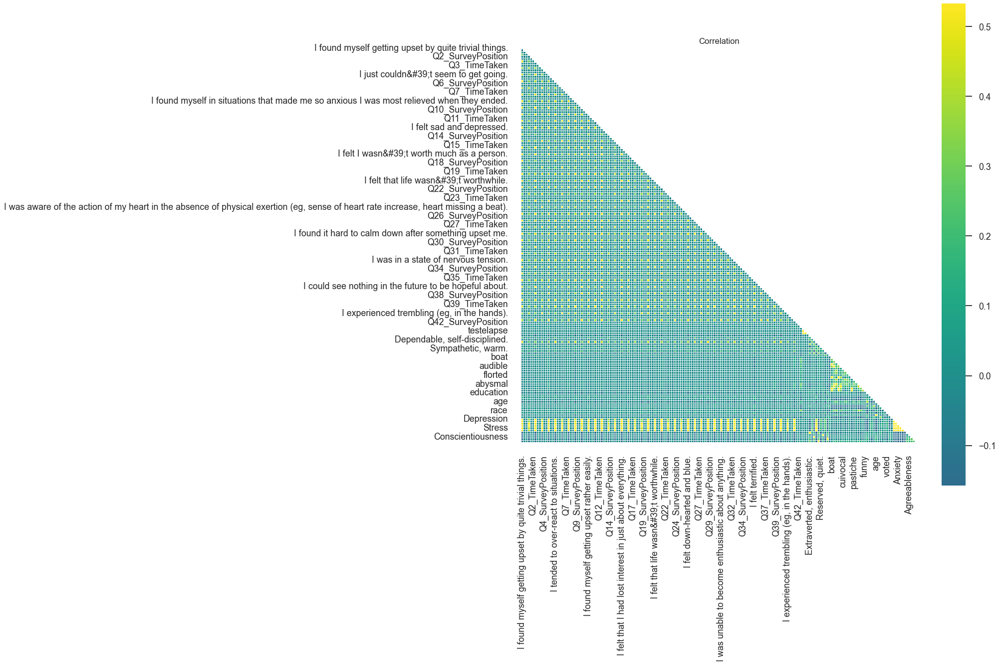

In [44]:
#Create a plot showing correlation
plt.figure(figsize=(16,16),dpi=80)
corr = df.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, mask=mask, cmap = 'viridis', robust=True, center=0, square=True, linewidths=.5)
plt.title('Correlation', fontsize=15)
plt.show()

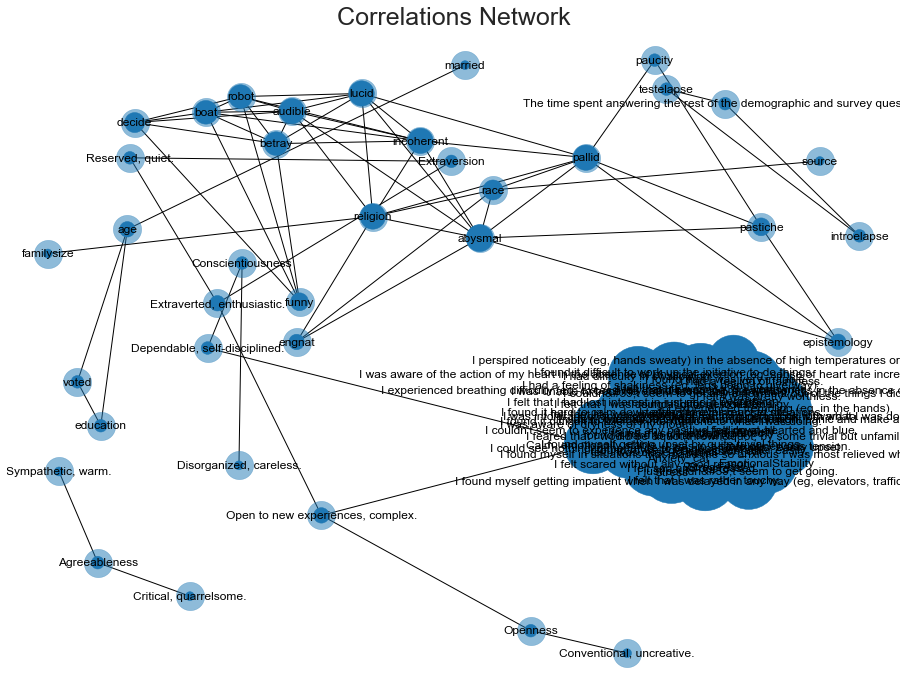

In [48]:
# Create a correlation network chart
thresh = 0.3
def correlation_network(data, corr_interval=[-0.8, 0.8], data_type="Train"):
    data = data
    corr = data.corr()
    corr = pd.melt(corr.reset_index(), id_vars='index')
    corr.columns = ['x', 'y', 'value']
    high_corr = corr[((corr['value'] <= corr_interval[0]) | (corr['value'] >= corr_interval[1]))]
    high_corr = high_corr[(high_corr['value'] != 1)].reset_index(drop=True)
    sources = list(high_corr.x.unique())
    targets = list(high_corr.y.unique())
    plt.figure(figsize=(16, 12))
    g = nx.from_pandas_edgelist(high_corr, source='x', target='y') 
    layout = nx.spring_layout(g, iterations=50, k=0.6, seed=1337)
    target_size = [g.degree(t) * 80 for t in targets]
    nx.draw_networkx_nodes(g, layout, nodelist=targets, node_size=target_size)
    nx.draw_networkx_nodes(g, layout, nodelist=sources, node_size=800, alpha=0.5)
    nx.draw_networkx_edges(g, layout, width=1)
    target_dict = dict(zip(targets, targets))
    nx.draw_networkx_labels(g, layout, labels=target_dict)
    plt.axis('off')
    plt.title(f'Correlations Network', fontsize=25)
    plt.show()
correlation_network(data=df, corr_interval=[-thresh, thresh], data_type="Train")

In [14]:
#t-SNE chart function
train_pp = df.copy()
def plot_dr(technique, title):
    start = time.time()
    technique = technique(n_components = 2)
    result = technique.fit_transform(train_pp[train_pp.select_dtypes(include='number').columns].values)
    plt.figure(figsize = (16, 8))
    plt.scatter(result[:,0], result[:,1], c = train_pp['gender' if 'gender' in train_pp.columns else list(train_pp.columns)[0]].values, s = 0.7, cmap=CMAP)
    plt.title(title,fontsize=18, fontweight='bold')
    plt.xticks([])
    plt.yticks([])
    plt.show()
    print('Duration: {} seconds'.format(time.time() - start))

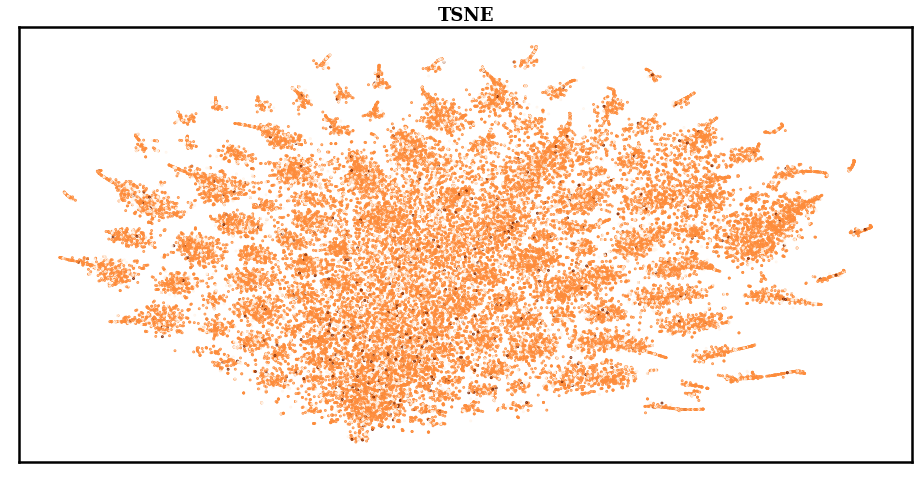

Duration: 965.6565890312195 seconds


In [15]:
#create t-sne visualisation
plot_dr(TSNE, "TSNE")

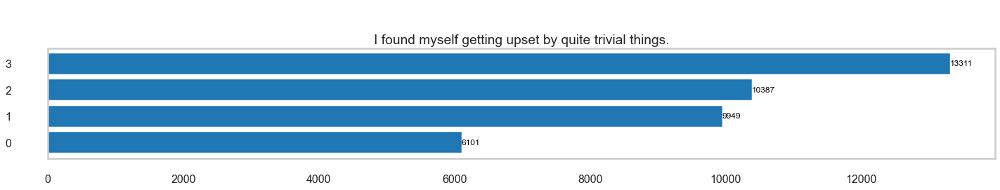

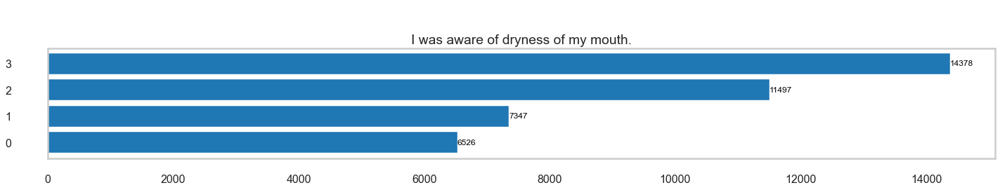

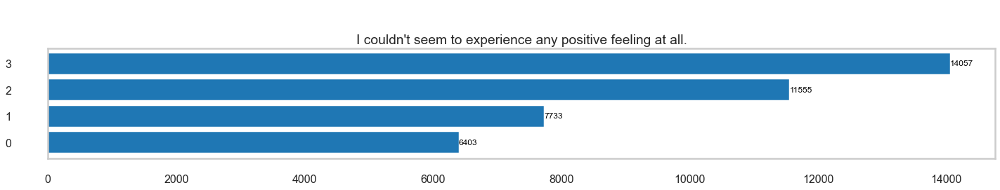

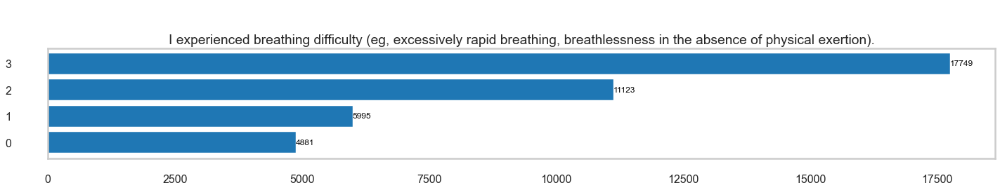

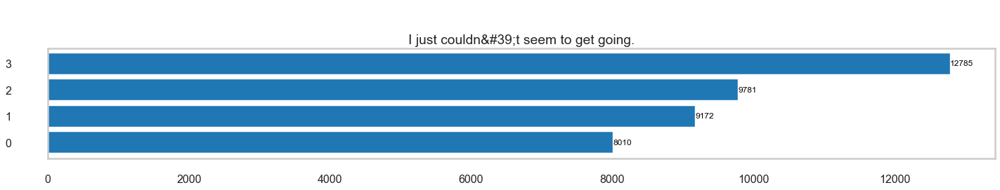

...

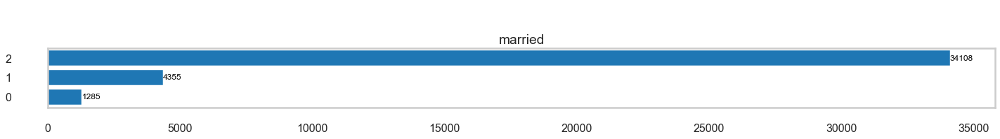

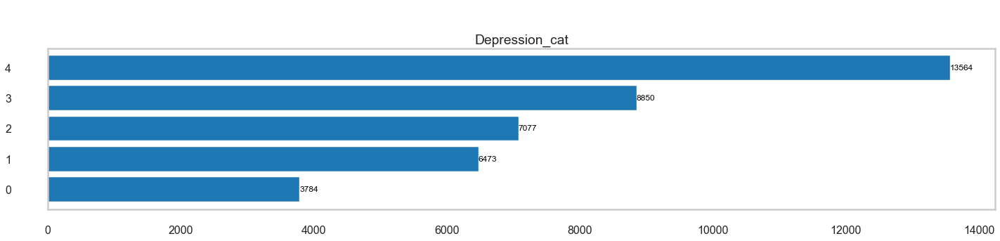

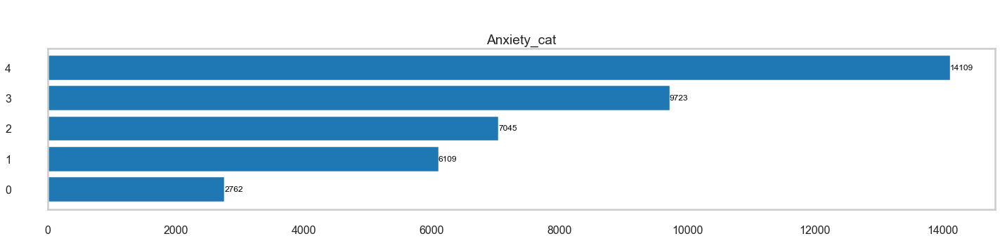

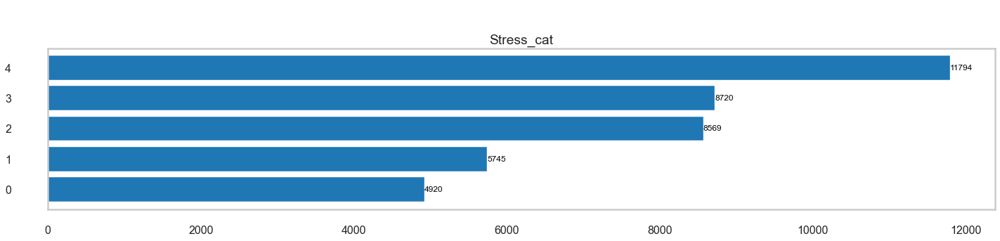

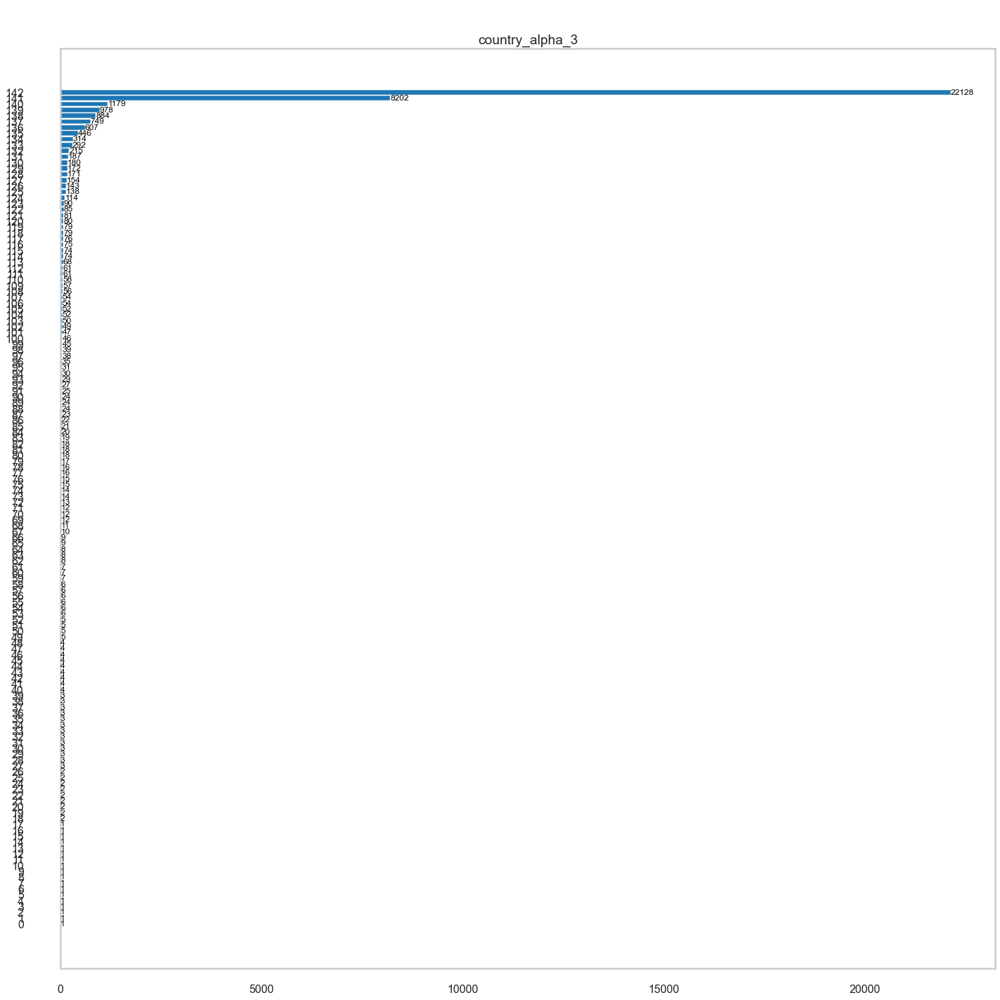

In [16]:
# Create a set of charts showing responses to 42 questions on Taylor Anxiety Scale Survey
sns.set_style("whitegrid")

def plot_barchart(df, col, order = None, x_label = None, y1_label = None, y2_label = None, title = None, figsize = (20, 4), plot_percentage = False, display_table = False, barh = False, colors = None, padding = None):    
    try: plt.close()
    except: pass
    plt.style.use('seaborn-poster')
    g = df[col].value_counts(ascending = True).to_dict()
    data = list(g.values())
    ind = np.arange(len(data))
    fig = plt.figure(tight_layout=True)
    ax = plt.subplot(111)
    # ax.set_yticks(ind * 0.5)
    ax.set_yticks(ind)
    bar = ax.barh(ind, data, 0.8, color = colors)
    # ax.set_yticks(ind * 0.5)
    for i, rect in enumerate(bar.patches):
        h = rect.get_height()
        w = rect.get_width()
        y = rect.get_y()
        ax.annotate(f"{w}", (w, y + h / 2), color = 'k', size = 12, ha = 'left', va = 'center')    
    fig.set_size_inches(figsize[0], figsize[1], forward=True)     
    plt.draw()
    yax = ax.get_yaxis()    
    if padding is None: pad = max(T.label.get_window_extent().width for T in yax.majorTicks)
    else: pad = padding
    yax.set_tick_params(pad=pad)
    ax.grid(False)
    plt.title('\n\n' + col)    
    plt.draw()
    plt.show()

def get_max_width(df, col, order = None, x_label = None, y1_label = None, y2_label = None, title = None, figsize = (20, 4), plot_percentage = False, display_table = False, barh = False, colors = None, padding = None):
    try: plt.close()
    except: pass
    plt.style.use('seaborn-poster')
    g = df[col].value_counts(ascending = True).to_dict()
    data = list(g.values())    
    ind = np.arange(len(data))
    fig = plt.figure(tight_layout=True)
    ax = plt.subplot(111)
    ax.barh(ind, data, 0.999)
    ax.set_yticks(ind + 0.5)
    fig.set_size_inches(figsize[0], figsize[1], forward=True)     
    plt.draw()
    yax = ax.get_yaxis()    
    pad = max(T.label.get_window_extent().width for T in yax.majorTicks)
    yax.set_tick_params(pad=pad)
    try: plt.close()
    except: pass
    return pad

categs = [i for i in df.columns if len(df[i].unique()) < 10 or i in df.select_dtypes(exclude='number').columns]
max_of_maxes = -1
plt_df = df.copy()
for col in categs:
    if col in q_dict: plt_df[col] = plt_df[col].astype('str').map(q_dict[col])    
    max_size = max([len(i) for i in plt_df[col].astype('str').tolist()])    
    max_of_maxes = max(max_of_maxes, max_size)

plt_df = df.copy()
max_pad_of_maxes = -1
for col in categs:
    if col in q_dict: plt_df[col] = plt_df[col].astype('str').map(q_dict[col])    
    max_size = get_max_width(plt_df, col, x_label = None, y1_label = None, title = col, barh = True)
    max_pad_of_maxes = max(max_pad_of_maxes, max_size)
    
for col in categs:
    plot_barchart(plt_df, col, x_label = None, y1_label = None, title = col, barh = True, padding = max_pad_of_maxes, figsize = (20, min(len(plt_df[col].unique()), 20)))

In [42]:
# Create charts showing data distribtion
def hist(col, title):
    plt.figure(figsize = (20, 8))
    ax = sns.distplot(col,kde=False);
    values = np.array([patch.get_height() for patch in ax.patches])
    norm = plt.Normalize(values.min(), values.max())
    colors = plt.cm.rainbow(norm(values))
    for patch, color in zip(ax.patches, colors): patch.set_color(color)
    plt.title(title, size = 20)
    sns.set_style("whitegrid")
def double_plot(x, title,c):
    fig, ax = plt.subplots(2,1,figsize=(20, 8),sharex=True)
    sns.distplot(x, ax=ax[0],color=c)
    ax[0].set(xlabel=None)
    ax[0].set_title('Histogram + KDE')
    sns.boxplot(x, ax=ax[1],color=c)
    ax[1].set(xlabel=None)
    ax[1].set_title('Boxplot')
    plt.tight_layout(pad=2.0)
    plt.show()

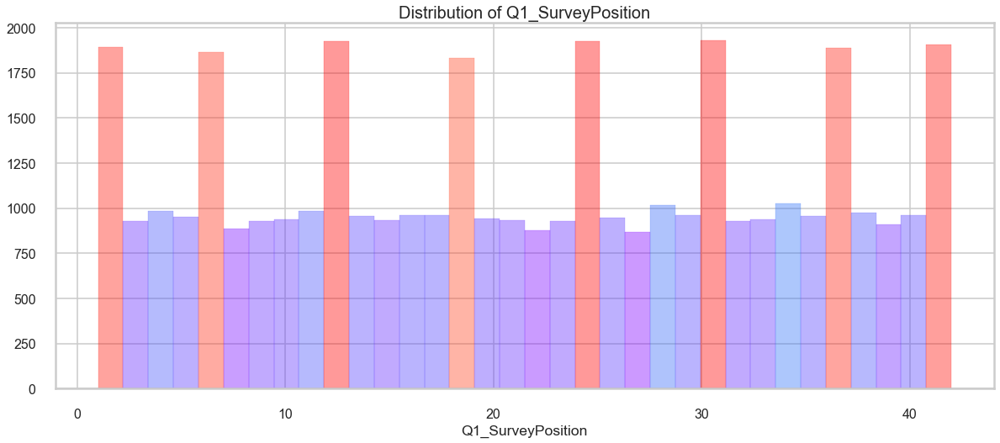

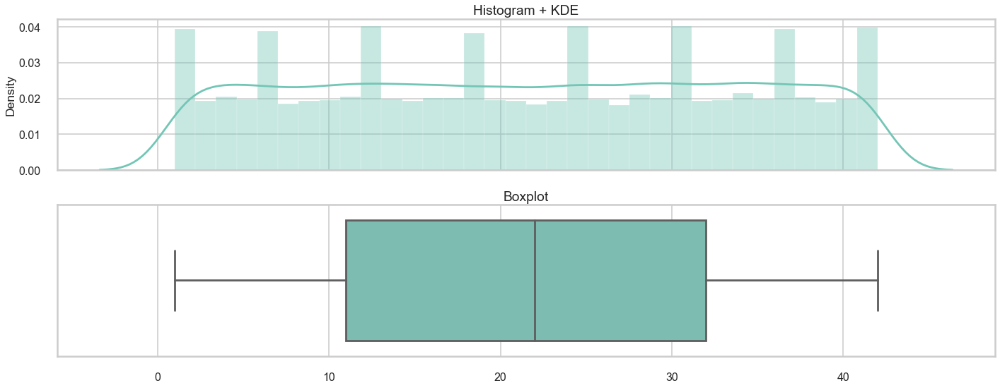

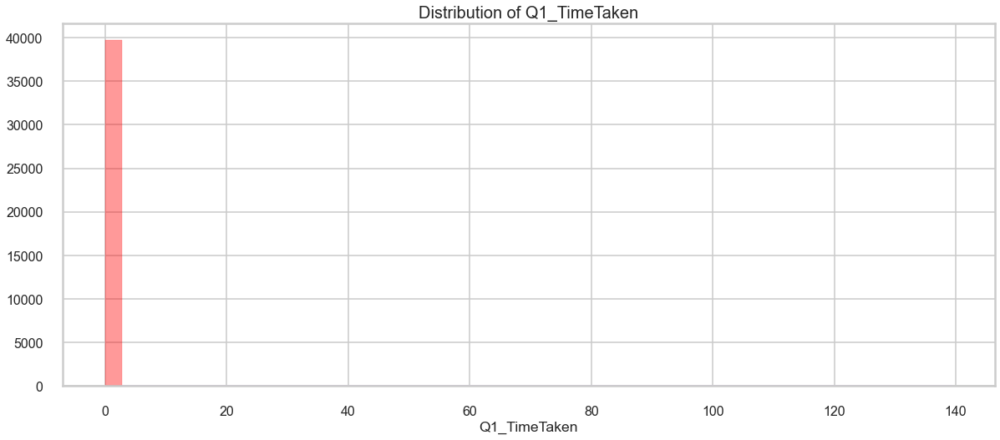

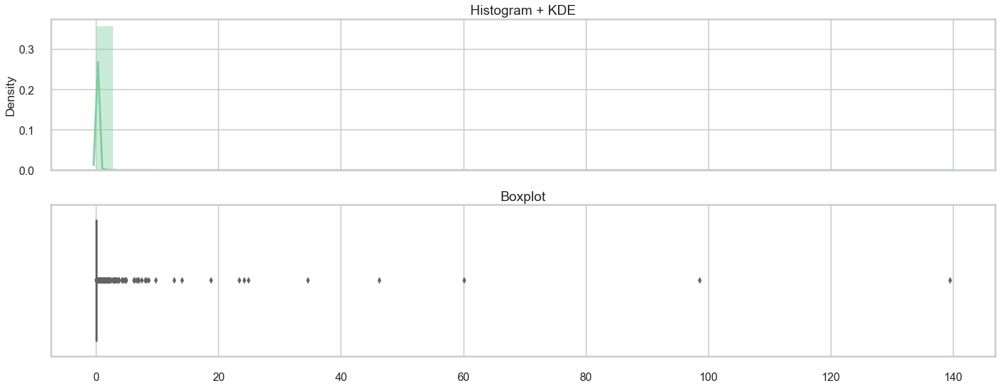

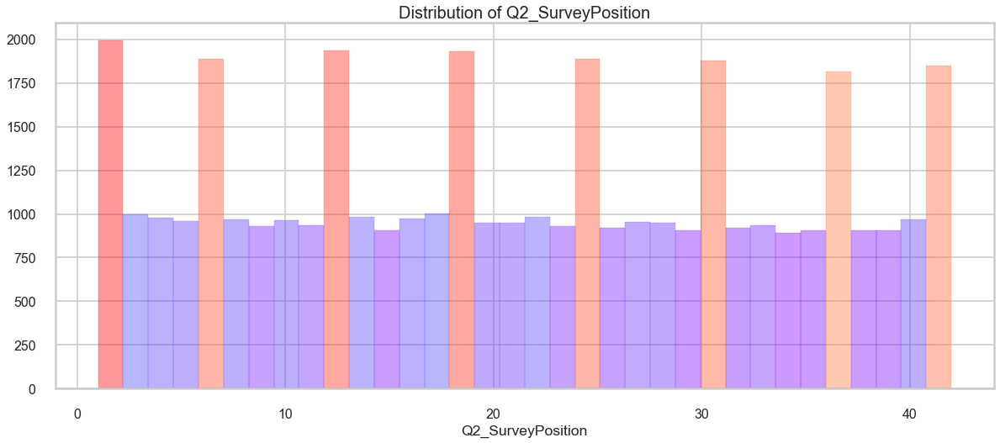

...

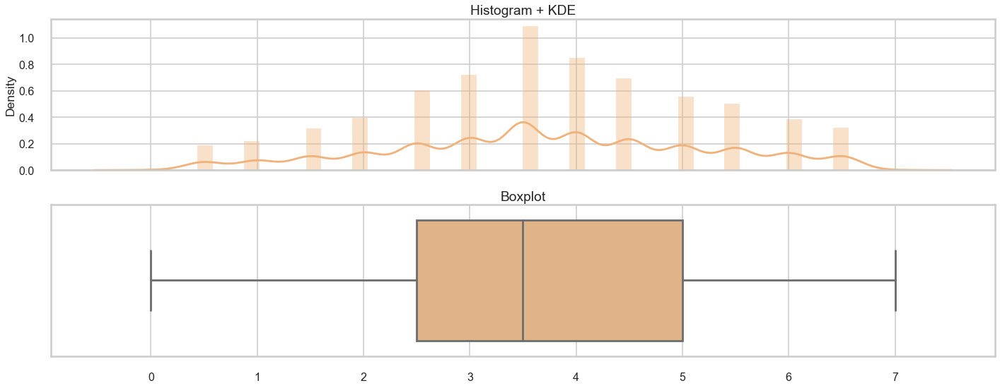

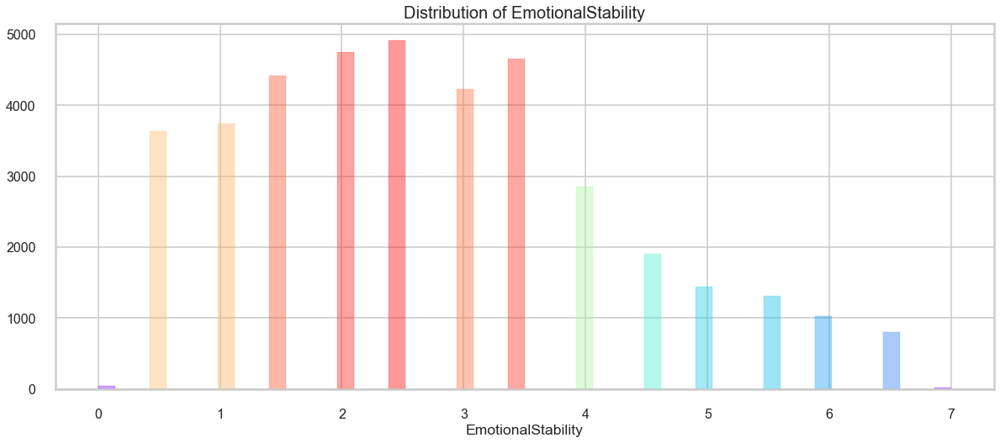

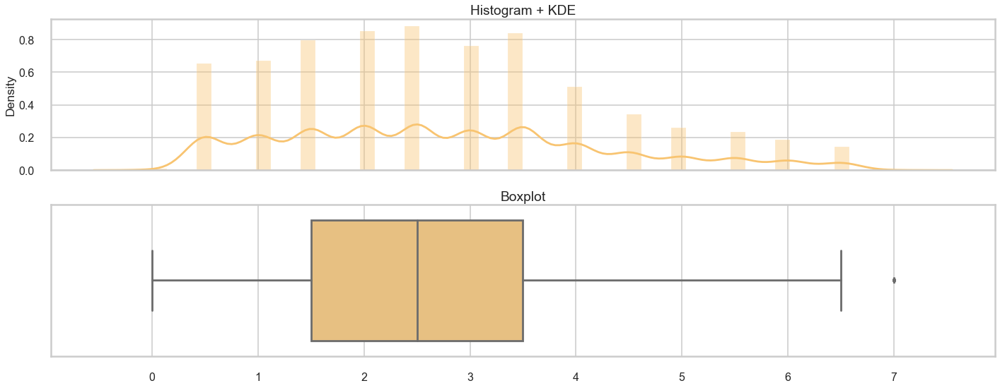

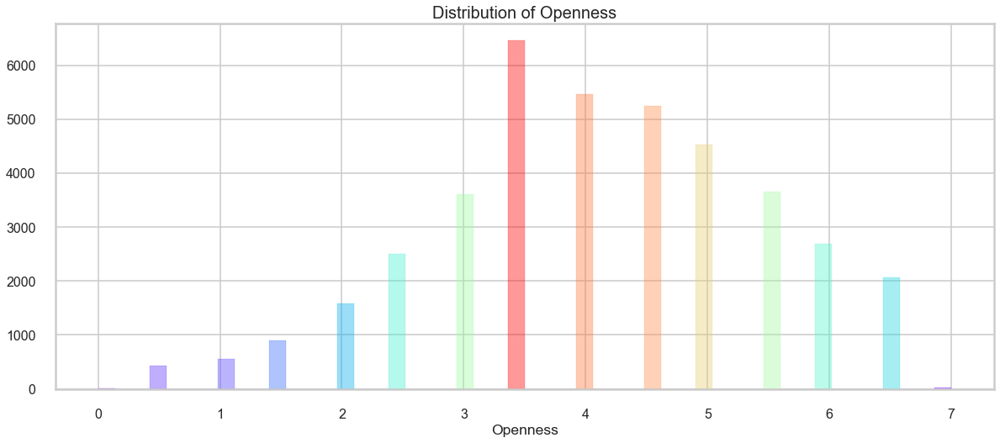

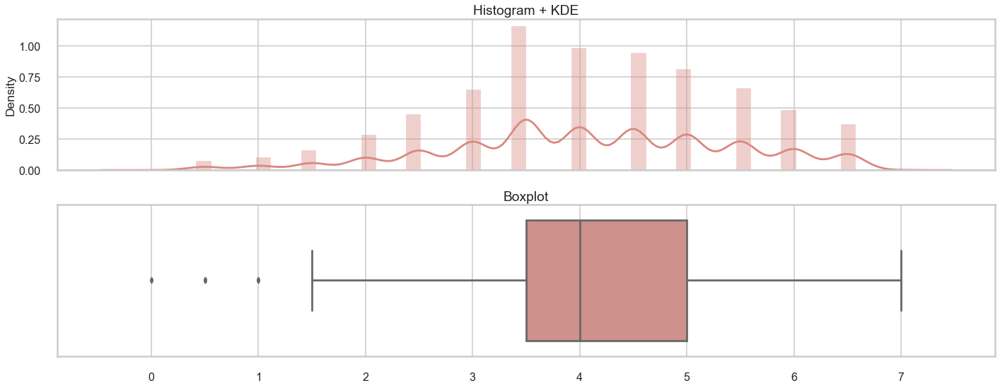

In [43]:
for col in [i for i in df.columns if i not in categs]: 
    hist(df[col], 'Distribution of ' + col)    
    double_plot(df[col],'Distribution ' + col, random.choice(list(color_maps.values()))[4])

In [19]:
# Scale time taken to respond, as it is measured in milliseconds.
s_sc = StandardScaler()

col_to_scale = list(df.columns.values)
cont_string = ['TimeTaken']
col_to_scale = [i for i in col_to_scale if any(j in i for j in cont_string)]
df[col_to_scale] = s_sc.fit_transform(df[col_to_scale])

In [20]:
train_df = df

### Model Prep

In [21]:
#Encode target variable
FOLDS = 5
SMOOTH = 0.001
SPLIT = 'interleaved'

encoder = TargetEncoder()

In [22]:
targets = ['Depression', 'Depression' + '_cat', 'Anxiety', 'Anxiety' + '_cat', 'Stress', 'Stress' + '_cat']
X = train_df.drop(targets, axis=1)
y = train_df['Depression']
y = (((y - y.mean()) / y.std()) > 0.0)
    
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, shuffle=True, stratify=y, random_state=seed)

for col in [i for i in df.columns if i not in categs and i not in targets]:
    X_train[col] = encoder.fit_transform(X_train[col],y_train)
    X_test[col] = encoder.transform(X_test[col])
    
features = list(X_train.select_dtypes(include = 'number').columns)

### Initial XGBoost Model

In [23]:
def print_score(clf, X_train, y_train, X_test, y_test, train=True):
    if train:
        pred = clf.predict(X_train)
        clf_report = pd.DataFrame(classification_report(y_train, pred, output_dict=True))
        print("Train Result:\n================================================")
        print(f"Accuracy Score: {accuracy_score(y_train, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_train, pred)}\n")
        
    elif train==False:
        pred = clf.predict(X_test)
        clf_report = pd.DataFrame(classification_report(y_test, pred, output_dict=True))
        print("Test Result:\n================================================")        
        print(f"Accuracy Score: {accuracy_score(y_test, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_test, pred)}\n")

In [24]:
# Run model
xgb_clf = XGBClassifier(enable_categorical=True, use_label_encoder=False)
xgb_clf.fit(X_train[features], y_train)

print_score(xgb_clf, X_train[features], y_train, X_test[features], y_test, train=True)
print_score(xgb_clf, X_train[features], y_train, X_test[features], y_test, train=False)

[22:48:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { enable_categorical } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:48:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Train Result:
Accuracy Score: 100.00%
_______________________________________________
CLASSIFICATION REPORT:
            False    True  accuracy  macro avg  weighted avg
precision     1.0     1.0       1.0        1.0           1.0
recall        1.0     1.0       1.0        1.0           1.0
f1

<Figure size 921.6x633.6 with 0 Axes>

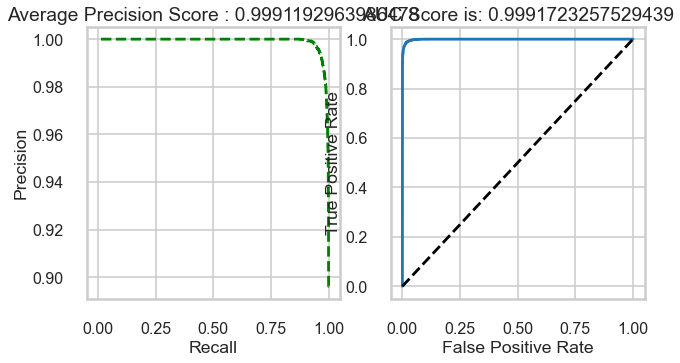

<Figure size 921.6x633.6 with 0 Axes>

In [25]:
def plotting(true,pred):
    fig,ax=plt.subplots(1,2,figsize=(10,5))
    precision,recall,threshold = precision_recall_curve(true,pred[:,1])
    ax[0].plot(recall,precision,'g--')
    ax[0].set_xlabel('Recall')
    ax[0].set_ylabel('Precision')
    ax[0].set_title("Average Precision Score : {}".format(average_precision_score(true,pred[:,1])))
    fpr,tpr,threshold = roc_curve(true,pred[:,1])
    ax[1].plot(fpr,tpr)
    ax[1].set_title("AUC Score is: {}".format(auc(fpr,tpr)))
    ax[1].plot([0,1],[0,1],'k--')
    ax[1].set_xlabel('False Positive Rate')
    ax[1].set_ylabel('True Positive Rate')
plotting(y_test,xgb_clf.predict_proba(X_test[features]))
plt.figure()   

### Tuned XGBoost Model

In [26]:
param_grid = dict(
    n_estimators=stats.randint(10, 1000),
    max_depth=stats.randint(1, 10),
    learning_rate=stats.uniform(0, 1)
)

xgb_clf = XGBClassifier(use_label_encoder=False)
xgb_cv = RandomizedSearchCV(
    xgb_clf, param_grid, cv=3, n_iter=10, 
    scoring='accuracy', n_jobs=-1, verbose=1
)
xgb_cv.fit(X_train[features], y_train)
best_params = xgb_cv.best_params_
print(f"Best paramters: {best_params}")

xgb_clf = XGBClassifier(**best_params)
xgb_clf.fit(X_train[features], y_train)

print_score(xgb_clf, X_train[features], y_train, X_test[features], y_test, train=True)
print_score(xgb_clf, X_train[features], y_train, X_test[features], y_test, train=False)

Fitting 3 folds for each of 10 candidates, totalling 30 fits
[22:54:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Best paramters: {'learning_rate': 0.6107491322046336, 'max_depth': 2, 'n_estimators': 62}
[22:54:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Train Result:
Accuracy Score: 99.72%
_______________________________________________
CLASSIFICATION REPORT:
                 False         True  accuracy     macro avg  weighted avg
precision     0.996609     0.997776   0.99717  

<Figure size 921.6x633.6 with 0 Axes>

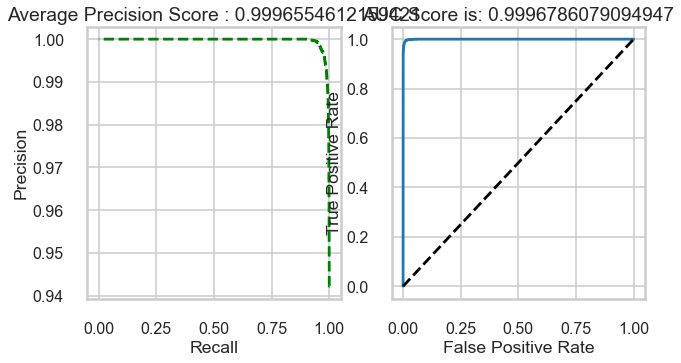

<Figure size 921.6x633.6 with 0 Axes>

In [27]:
plotting(y_test,xgb_clf.predict_proba(X_test[features]))
plt.figure()   

### Feature Importance for Tuned XGBoost Model

In [28]:
def feature_imp(df, model):
    fi = pd.DataFrame()
    fi["feature"] = df.columns
    fi["importance"] = model.feature_importances_
    return fi.sort_values(by="importance", ascending=False)

In [29]:
imp = feature_imp(X_train[features], xgb_clf)
imp = imp.head(20)
print(imp)

                                               feature  importance
60             I felt that life wasn&#39;t worthwhile.    0.359303
99                      I felt I was pretty worthless.    0.136812
45   I felt that I had lost interest in just about ...    0.069048
111                  I felt that life was meaningless.    0.064277
27       I felt that I had nothing to look forward to.    0.059949
36                           I felt sad and depressed.    0.049824
12              I just couldn&#39;t seem to get going.    0.033760
90   I was unable to become enthusiastic about anyt...    0.029270
69   I couldn&#39;t seem to get any enjoyment out o...    0.028598
6    I couldn't seem to experience any positive fee...    0.026863
123  I found it difficult to work up the initiative...    0.024773
108  I could see nothing in the future to be hopefu...    0.024483
75                       I felt down-hearted and blue.    0.024453
48         I felt I wasn&#39;t worth much as a person.    0.02

### Aritificial Neural Network

In [30]:
classifier = Sequential()

# Adding the input layer
classifier.add(Dense(kernel_initializer = 'normal', activation = 'relu', units=20, input_dim = 173))

# Adding the second hidden layer
classifier.add(Dense(kernel_initializer = 'normal', activation = 'relu', units=20))

# Adding the output layer
classifier.add(Dense(kernel_initializer = 'normal', activation = 'sigmoid', units=1))

# Compiling the ANN
classifier.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy','AUC'])

In [31]:
history = classifier.fit(X_train[features], y_train, validation_data=(X_test[features], y_test),batch_size = 10, epochs = 50)

Epoch 1/50
1590/1590 [==============================] - 6s 3ms/step - loss: 0.6237 - accuracy: 0.8356 - auc: 0.9168 - val_loss: 0.1568 - val_accuracy: 0.9409 - val_auc: 0.9874
Epoch 2/50
1590/1590 [==============================] - 4s 3ms/step - loss: 0.1614 - accuracy: 0.9359 - auc: 0.9863 - val_loss: 0.1681 - val_accuracy: 0.9512 - val_auc: 0.9938
Epoch 3/50
1590/1590 [==============================] - 4s 2ms/step - loss: 0.1185 - accuracy: 0.9508 - auc: 0.9921 - val_loss: 0.0886 - val_accuracy: 0.9606 - val_auc: 0.9956
Epoch 4/50
1590/1590 [==============================] - 3s 2ms/step - loss: 0.0962 - accuracy: 0.9565 - auc: 0.9942 - val_loss: 0.0811 - val_accuracy: 0.9580 - val_auc: 0.9973
Epoch 5/50
1590/1590 [==============================] - 3s 2ms/step - loss: 0.1199 - accuracy: 0.9542 - auc: 0.9928 - val_loss: 0.1109 - val_accuracy: 0.9556 - val_auc: 0.9948
Epoch 6/50
1590/1590 [==============================] - 4s 2ms/step - loss: 0.0957 - accuracy: 0.9541 - auc: 0.9942 - va

In [32]:
# Predicting the Test set results
y_pred = classifier.predict(X_test[features])

accuracy of the model:  0.9717807874544006


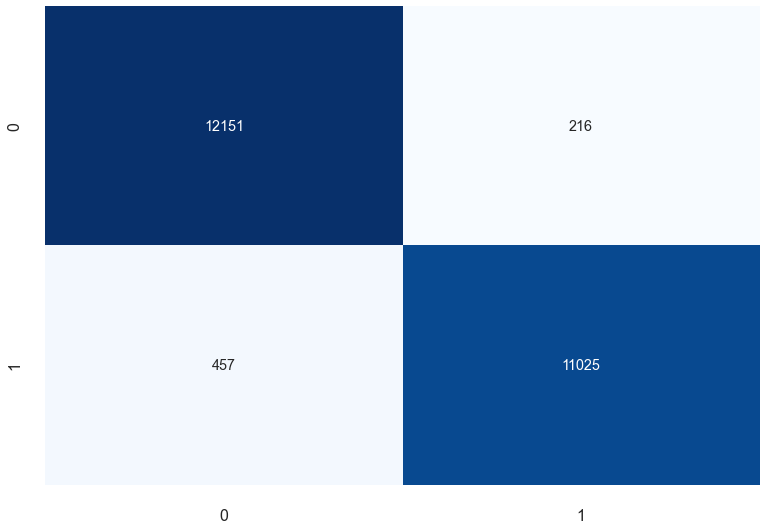

In [33]:
# Create confusion matrix
cm = confusion_matrix(y_test, y_pred.round())
sns.heatmap(cm,annot=True,cmap="Blues",fmt="d",cbar=False)
#accuracy score
from sklearn.metrics import accuracy_score
ac=accuracy_score(y_test, y_pred.round())
print('accuracy of the model: ',ac)

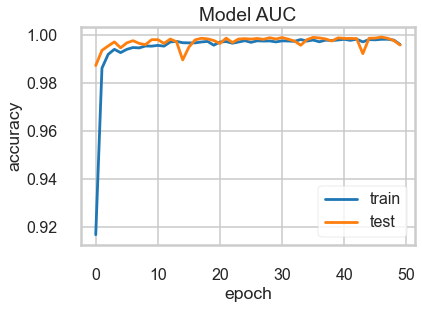

In [34]:
#Plot area under curve by epoch
%matplotlib inline
# Model auc
plt.plot(history.history['auc'])
plt.plot(history.history['val_auc'])
plt.title('Model AUC')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'])
plt.show()